# Методы анализа сетевых структур
### Домашнее задание #1
### Исследование зависимости характеристик случайных графов от параметров моделей
##### **Игорь Рухович. 22МАГИАД**

# Imports

In [100]:
import networkx as nx
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

# Characteristics

In [110]:
# Local clustering coefficient for node #U
def get_local_clustering_coef(g: nx.Graph, u=0):
    return nx.clustering(g, u)

# Average clustering coefficient
def get_avg_clustering_coef(g: nx.Graph):
    return nx.average_clustering(g)

# Global clustering coefficient
def get_global_clustering_coef(g: nx.Graph):
    return nx.transitivity(g)

# Diameter of the graph (maximal distance between two nodes)
# Since only works for connected graphs, we take the largest connected component
def get_graph_diameter(g: nx.Graph):
    g = g.subgraph(max(nx.connected_components(g), key=len))
    return nx.diameter(g)

# Density of the graph (number of edges relative to the maximum number)
def get_graph_density(g: nx.Graph):
    return nx.density(g)

# Length of the average shortest path in the graph
# Since only works for connected graphs, we take the largest connected component
def get_avg_shortest_path_length(g: nx.Graph):
    g = g.subgraph(max(nx.connected_components(g), key=len))
    return nx.average_shortest_path_length(g)

# Distribution of vertex degree
def plot_graph_degree_distribution(g: nx.Graph, ax):
    sns.histplot([v for v in dict(g.degree()).values()], bins=20, ax=ax, kde=True)

# Utility functions

In [126]:
# No approximation
def plot_real_characteristic(xses, ans, ax):
    sns.lineplot(x=xses, y=ans, label="real", ax=ax)

# Linear approximation
def plot_linear_approximation(xses, ans, ax):
    coefs = np.polyfit(x=xses, y=ans, deg=1)
    function = np.poly1d(coefs)
    sns.lineplot(x=xses, y=function(xses), label="linear", ax=ax)

# Quadratic function approximation
def plot_quadratic_approximation(xses, ans, ax):
    coefs = np.polyfit(x=xses, y=ans, deg=2)
    function = np.poly1d(coefs)
    sns.lineplot(x=xses, y=function(xses), label="quadratic", ax=ax)

# Cubic function approximation
def plot_cubic_approximation(xses, ans, ax):
    coefs = np.polyfit(x=xses, y=ans, deg=3)
    function = np.poly1d(coefs)
    sns.lineplot(x=xses, y=function(xses), label="cubic", ax=ax)

In [150]:
def compute_plot_characteristic(ch, xses, graphs, ax):
    ans = []
    for graph in graphs:
        ans.append(ch(graph))
    plot_real_characteristic(xses, ans, ax)
    plot_linear_approximation(xses, ans, ax)
    plot_quadratic_approximation(xses, ans, ax)
    plot_cubic_approximation(xses, ans, ax)


def compute_plot_all_characteristics(xses, graphs, x_name):
    _, axs = plt.subplots(2, 3, figsize=(21, 14))
    axs = axs.ravel()
    for ax in axs:
        ax.set_xlabel(x_name)
        ax.set_ylabel("Value")

    compute_plot_characteristic(get_local_clustering_coef, xses, graphs, axs[0])
    axs[0].set_title("Local clustering coefficient (for node 0)")
    compute_plot_characteristic(get_avg_clustering_coef, xses, graphs, axs[1])
    axs[1].set_title("Average local clustering coefficient")
    compute_plot_characteristic(get_global_clustering_coef, xses, graphs, axs[2])
    axs[2].set_title("Global clustering coefficient")
    compute_plot_characteristic(get_graph_diameter, xses, graphs, axs[3])
    axs[3].set_title("Largest component's diameter")
    compute_plot_characteristic(get_graph_density, xses, graphs, axs[4])
    axs[4].set_title("Graph density")
    compute_plot_characteristic(get_avg_shortest_path_length, xses, graphs, axs[5])
    axs[5].set_title("Largest component's average shortest path")
    plt.legend()
    plt.tight_layout()
    plt.show()


def compute_plot_degree_dist(xses, graphs, x_name):
    _, axs = plt.subplots(2, 3, figsize=(21, 14))
    axs = axs.ravel()
    for ax in axs:
        ax.set_xlabel("Degree distribution histogram")
        ax.set_ylabel("Value")

    idx_to_take = []
    idx_cur = 0
    diff = len(xses) // 6
    while len(idx_to_take) < 6 and idx_cur < len(xses):
        idx_to_take.append(idx_cur)
        idx_cur += diff

    for num, i in enumerate(idx_to_take):
        plot_graph_degree_distribution(graphs[i], axs[num])
        axs[num].set_title(f"Degree distribution hist approximation, {x_name} = {xses[i]}")

# 1. Binomial model

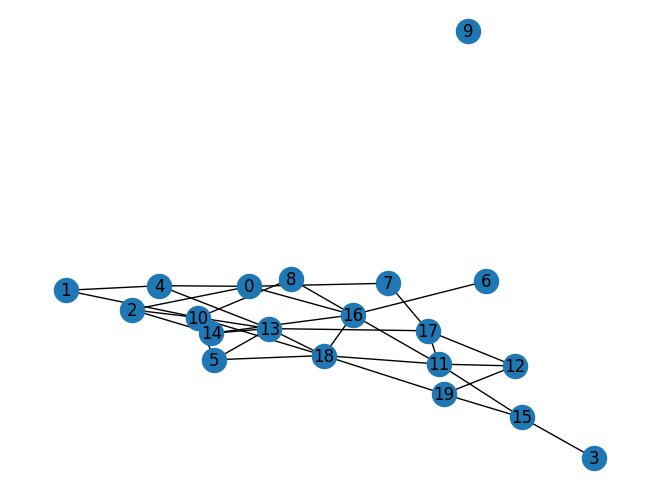

In [165]:
# Params:
# n - number of vertices
# p - probability of any edge creation

n = 20
p = 0.2

g = nx.binomial_graph(n=n, p=p)
nx.draw(g, with_labels=True)

### 1.1 Fixed n=100

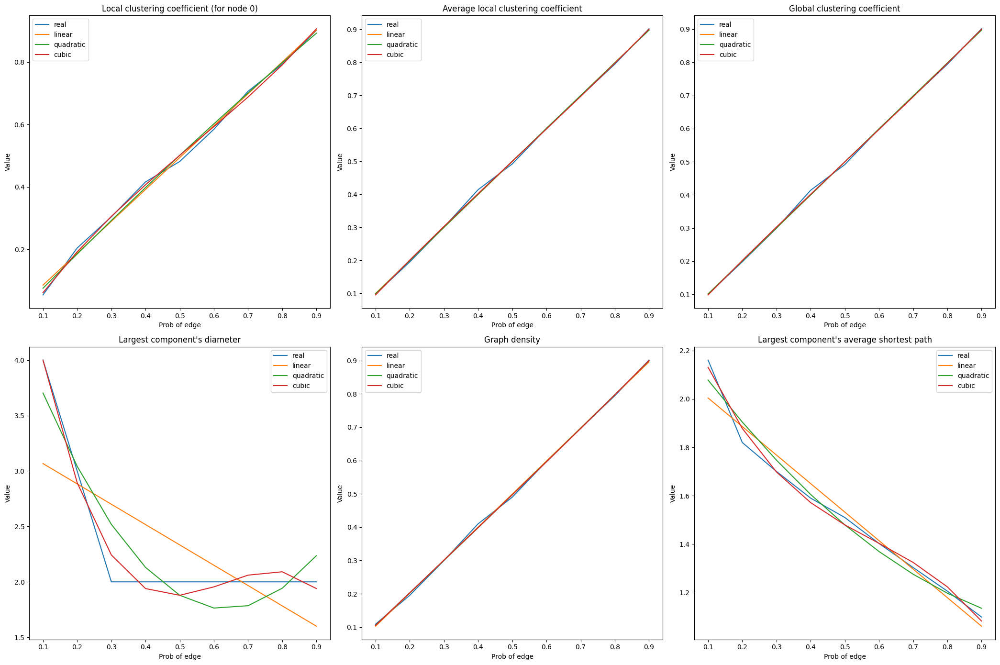

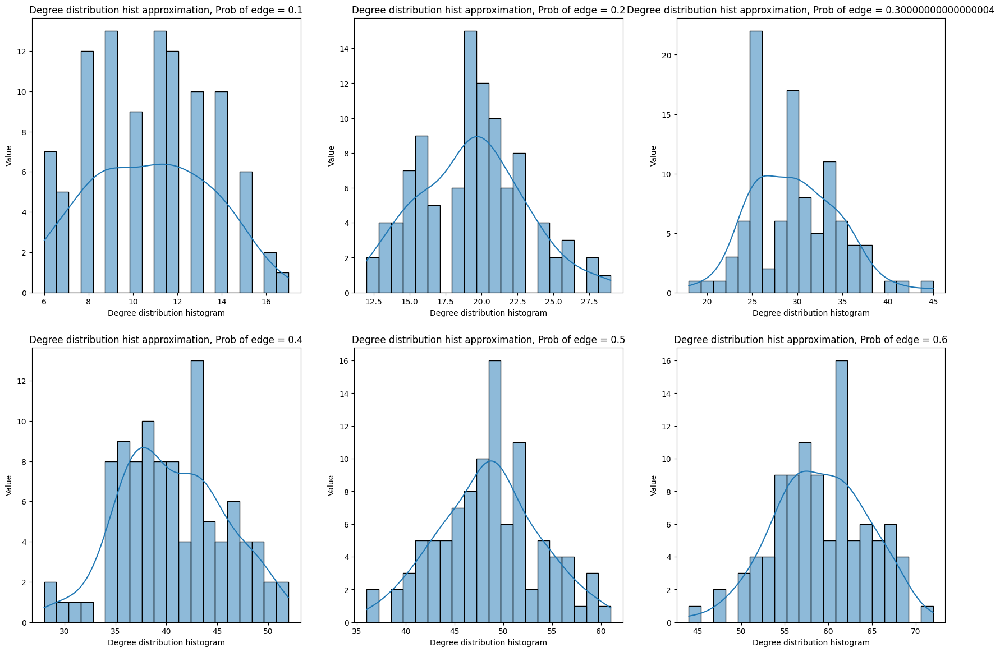

In [166]:
n = 100
p_s = np.arange(0.1, 1, 0.1)
param_name = "Prob of edge"
graphs = [nx.binomial_graph(n=n, p=p) for p in p_s]

compute_plot_all_characteristics(p_s, graphs, param_name)
compute_plot_degree_dist(p_s, graphs, param_name)

### 1.2 Fixed p=0.25

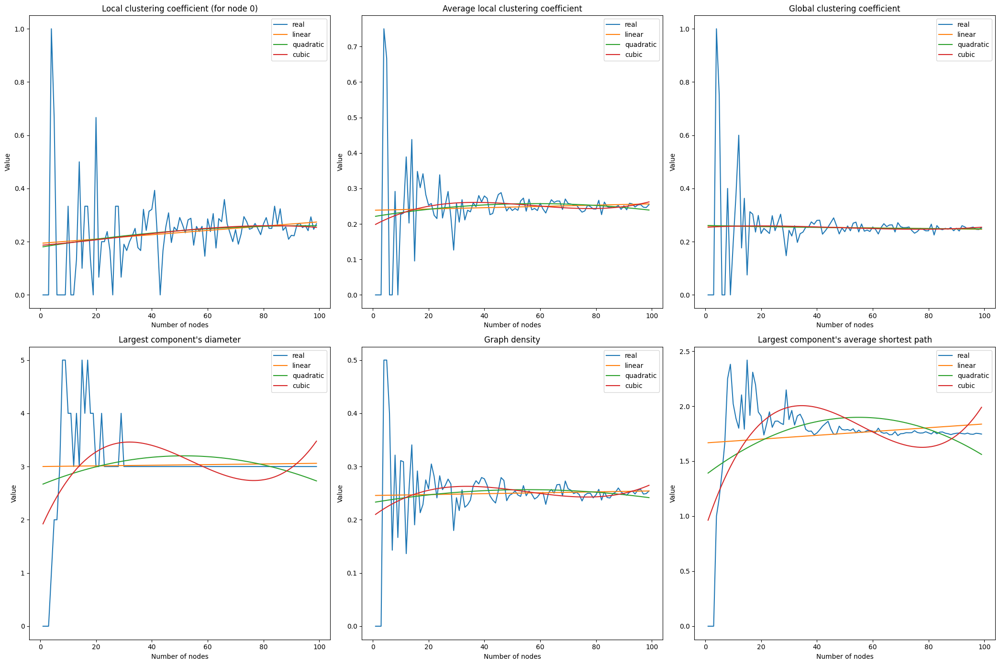

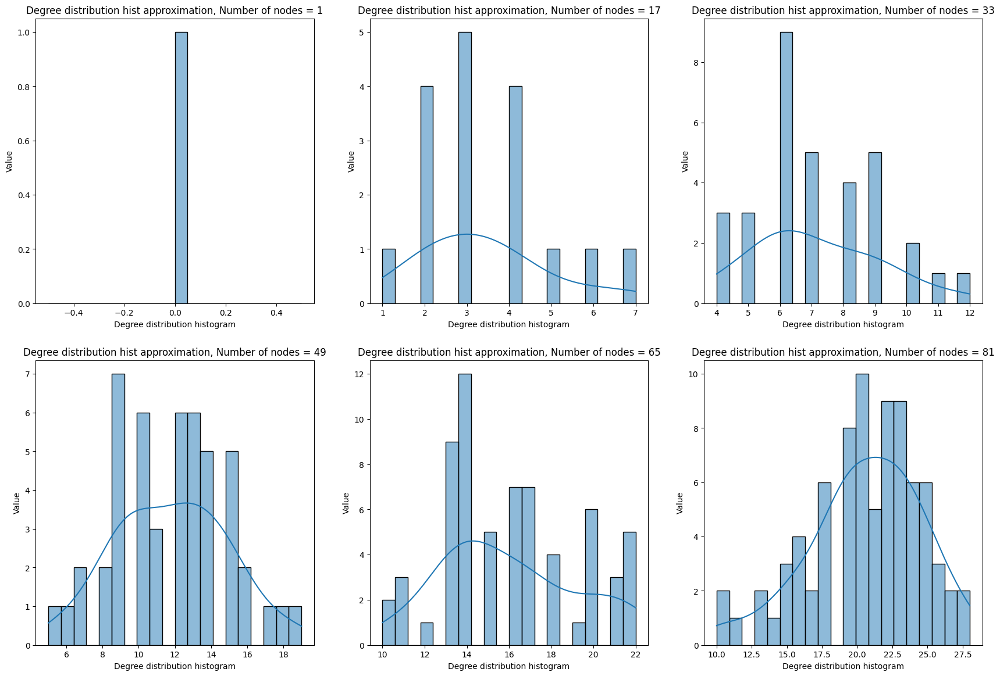

In [167]:
p = 0.25
n_s = range(1, 100)
param_name = "Number of nodes"
graphs = [nx.binomial_graph(n=n, p=p) for n in n_s]

compute_plot_all_characteristics(n_s, graphs, param_name)
compute_plot_degree_dist(n_s, graphs, param_name)

# Other

Анализ:

Все верхние метрики при увеличении n стремятся к константному значению

1. diameter стремится к 2
2. density стремится к fixed_p
3. коэффициенты кластеризации также стремятся к fixed_p
4. средняя длина стремится к 1.5

Эти графики сложно аппроксимировать нормально автоматически, но очевидно что это должна быть линейная функция и при больших n аппроксимирующая прямая будет стремиться к горизонтальной линии

Нижние графики можно хорошо аппроксимировать биномиальным распределением с N = n - 1, P = fixed_p.

Анализ:

1. diameter при малом p сначала равен 3 и при увеличении p стремится к 2
2. density зависит от p как f(x) = x
3. коэффициенты кластеризации также зависят от p как f(x) = x
4. средняя длина линейно уменьшается при увеличении p

Нижние графики можно хорошо аппроксимировать биномиальным распределением с N = n - 1, P = fixed_p.

Выводы: Полученные результаты схожи с теоретическими - графы имеют малый диаметер и биномиальное распределение.

# 2. Watts–Strogatz model

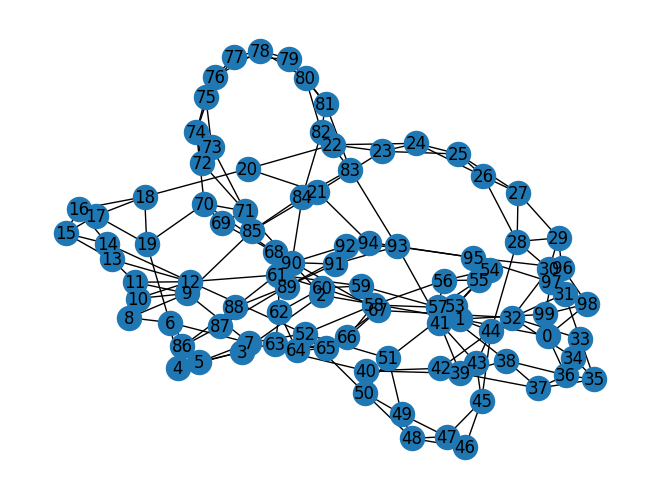

In [188]:
# Params:
# n - number of vertices
# k - number of nearest neighbors
# p - probability of rewiring an edge

n = 100
k = 4
p = 0.1

g = nx.connected_watts_strogatz_graph(n=n, k=k, p=p)
nx.draw(g, with_labels=True)

### 2.1 Fixed n=100, k=5

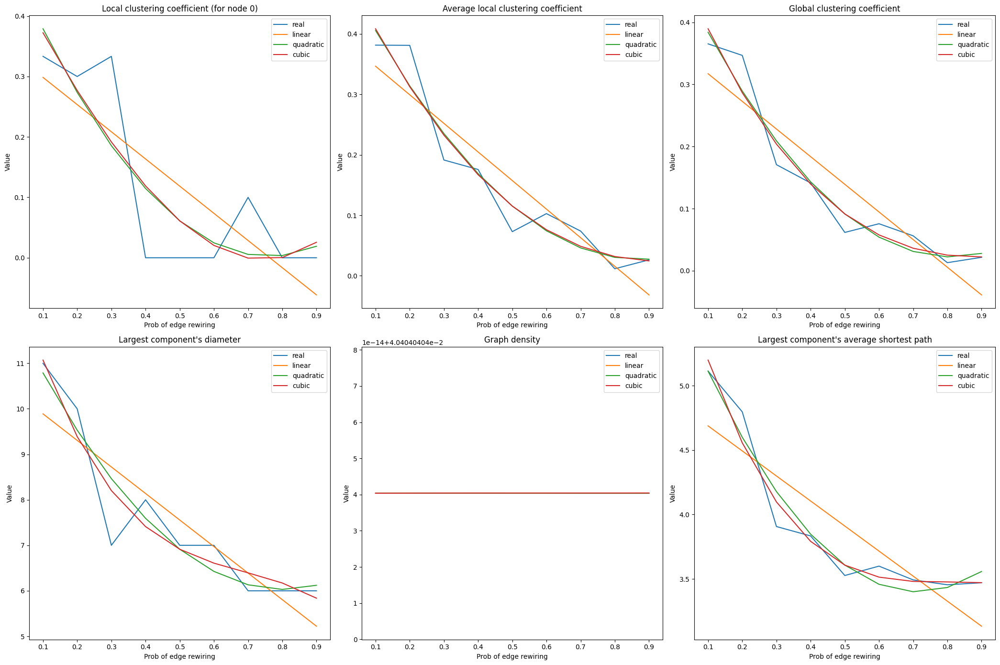

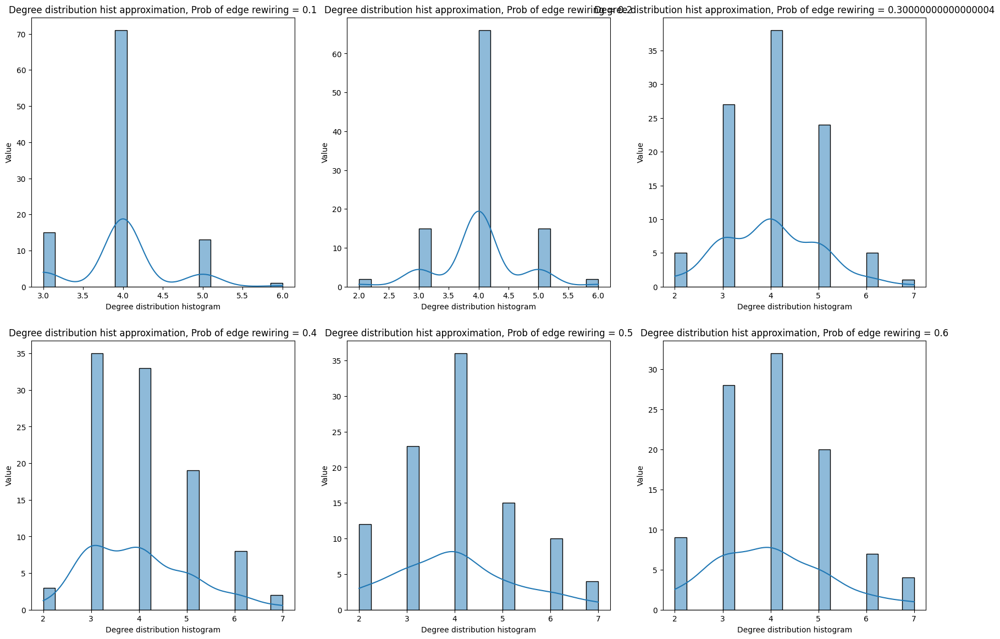

In [178]:
n = 100
k = 5
p_s = np.arange(0.1, 1, 0.1)
param_name = "Prob of edge rewiring"
graphs = [nx.connected_watts_strogatz_graph(n=n, k=k, p=p) for p in p_s]

compute_plot_all_characteristics(p_s, graphs, param_name)
compute_plot_degree_dist(p_s, graphs, param_name)

### 2.2 Fixed n=100, p=0.1

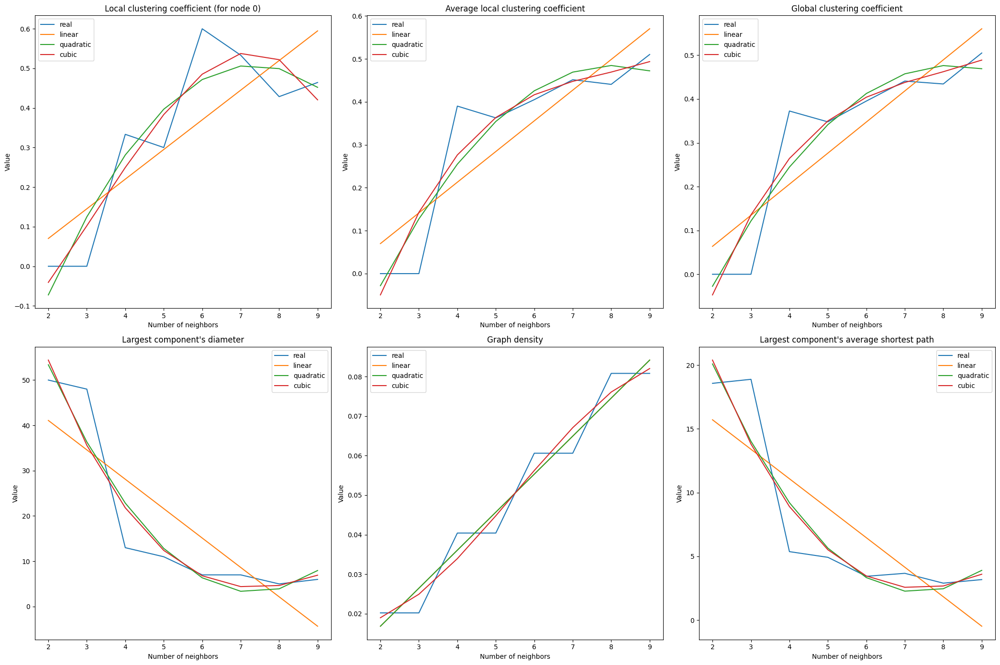

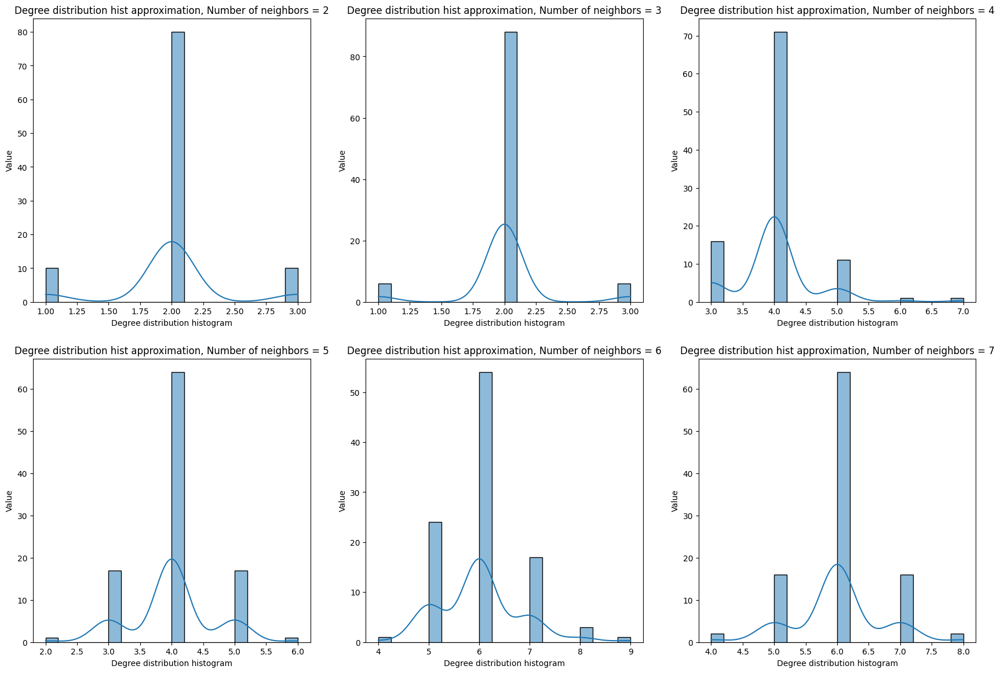

In [189]:
n = 100
p = 0.1
k_s = np.arange(2, 10, 1)
param_name = "Number of neighbors"
graphs = [nx.connected_watts_strogatz_graph(n=n, k=k, p=p) for k in k_s]

compute_plot_all_characteristics(k_s, graphs, param_name)
compute_plot_degree_dist(k_s, graphs, param_name)

### 2.3 Fixed k=5, p=0.1

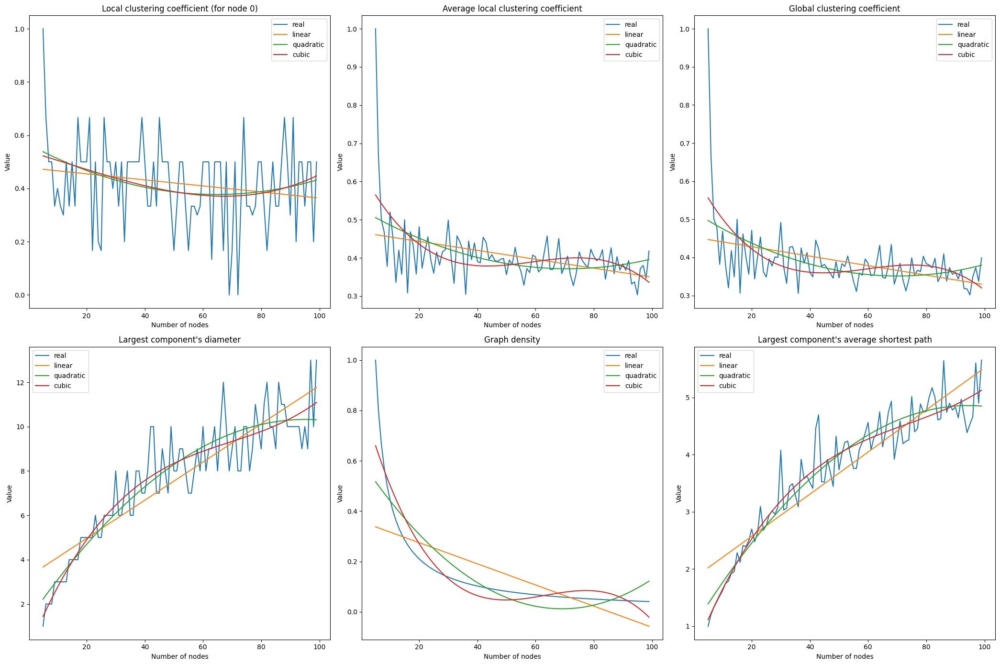

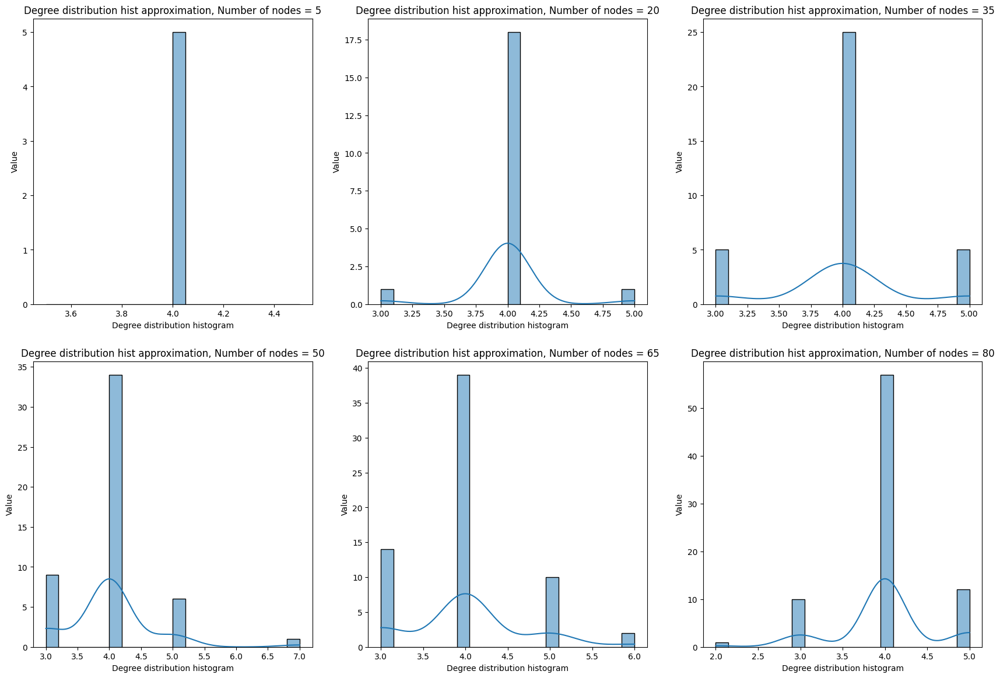

In [192]:
k = 5
p = 0.1
n_s = range(5, 100)
param_name = "Number of nodes"
graphs = [nx.connected_watts_strogatz_graph(n=n, k=k, p=p) for n in n_s]

compute_plot_all_characteristics(n_s, graphs, param_name)
compute_plot_degree_dist(n_s, graphs, param_name)

# Other

is_connected :  True
diameter :  4
density :  0.16666666666666666
average_local_clustering_cf :  0.16304761904761902
global_clustering_cf :  0.16167664670658682
average_length :  2.31


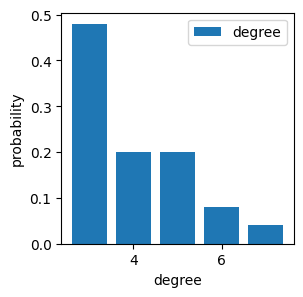

In [ ]:
is_connected, diameter, density, average_local_clustering_cf, global_clustering_cf, (degree_values, degree_hist), average_length = get_metrics(g)
%p is_connected
%p diameter
%p density
%p average_local_clustering_cf
%p global_clustering_cf
%p average_length

plt.figure(figsize=(3, 3))
plt.bar(degree_values, degree_hist)
plt.legend(['degree'])
plt.xlabel('degree')
plt.ylabel('probability')
plt.show()

In [ ]:
n_range = [x * x for x in range(4, 40, 4)]
p_range = [0.2, 0.35, 0.5, 0.65, 0.8]
k_range = [2, 3, 4, 5]
n_metrics = defaultdict(list)
fixed_p = 0.5
p_metrics = defaultdict(list)
fixed_n = 256
k_metrics =  defaultdict(list)
fixed_k = 3

# Метрики по n
for param in n_range:
    get_graph = lambda param: nx.connected_watts_strogatz_graph(param, fixed_k, fixed_p, seed=228)
    calc_metrics(param, get_graph, n_metrics, avg_times=10)

# Метрики по p
for param in p_range:
    get_graph = lambda param: nx.connected_watts_strogatz_graph(fixed_n, fixed_k, param, seed=228)
    calc_metrics(param, get_graph, p_metrics, avg_times=10)

# Метрики по k
for param in k_range:
    get_graph = lambda param: nx.connected_watts_strogatz_graph(fixed_n, param, fixed_p, seed=228)
    calc_metrics(param, get_graph, k_metrics, avg_times=10)

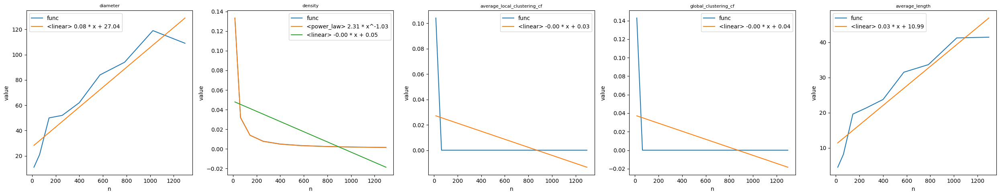

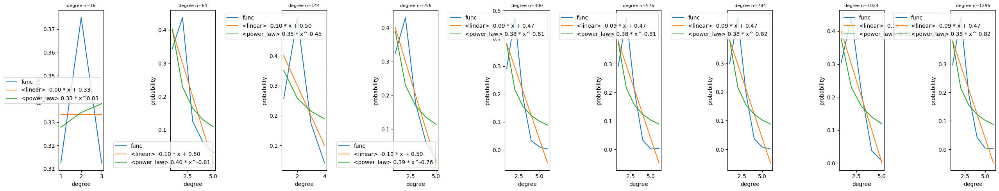

In [ ]:
approxim_by = {
    'diameter': [fit_linear],
    'density': [fit_power_law, fit_linear],
    'average_local_clustering_cf': [fit_linear],
    'global_clustering_cf': [fit_linear],
    'average_length': [fit_linear],
    'degree': [fit_linear, fit_power_law],
}

plot_metrics(n_range, n_metrics, 'n', approxim_by)

Анализ:

1. diameter и средняя пути линейно увеличиваются при увеличении n
2. density растет обратно пропорционально n. Ее можно аппроксимировать как c * 1/x
3. коэффициенты кластеризации кажется что не зависят от n и замирают на определенном значении

Нижние графики можно с невысоким успехом аппроксимировать линейной функцией. В теории для данной модели это должен быть график Dirac delta function. Можно заметить, что распределение степеней вершин не меняется относительно n.

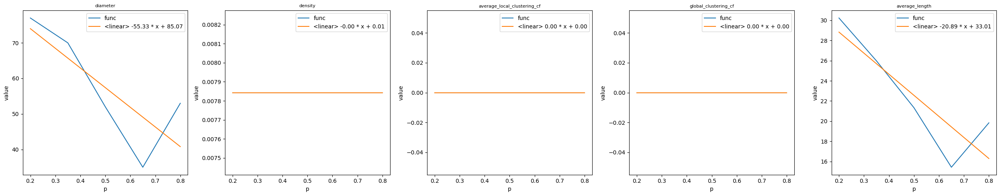

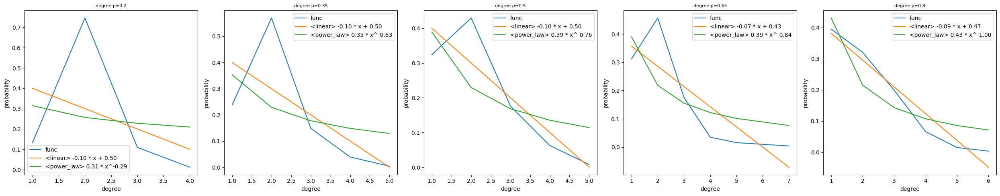

In [ ]:
approxim_by = {
    'diameter': [fit_linear],
    'density': [fit_linear],
    'average_local_clustering_cf': [fit_linear],
    'global_clustering_cf': [fit_linear],
    'average_length': [fit_linear],
    'degree': [fit_linear, fit_power_law],
}

plot_metrics(p_range, p_metrics, 'p', approxim_by)

Анализ:

1. diameter и средняя пути линейно уменьшаются при увеличении n
2. density не меняется в зависимости от p
3. коэффициенты кластеризации не меняются в зависимости от p

Нижние графики можно с невысоким успехом аппроксимировать линейной функцией. На нижних графиках зависимость распределения степеней вершин от p не выявлена

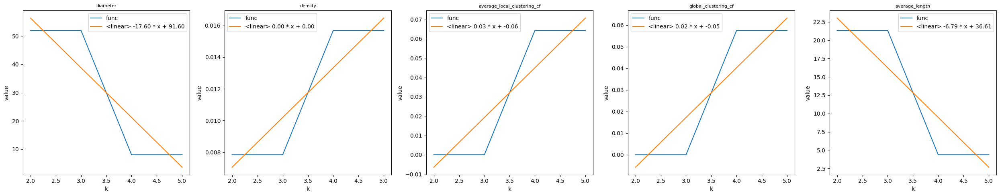

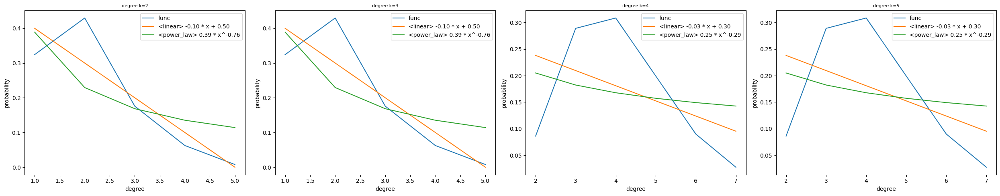

In [ ]:
approxim_by = {
    'diameter': [fit_linear],
    'density': [fit_linear],
    'average_local_clustering_cf': [fit_linear],
    'global_clustering_cf': [fit_linear],
    'average_length': [fit_linear],
    'degree': [fit_linear, fit_power_law],
}

plot_metrics(k_range, k_metrics, 'k', approxim_by)

Анализ:

1. diameter и средняя пути линейно уменьшаются при увеличении k
2. density увеличивается при увеличении k
3. коэффициенты кластеризации линейно уменьшаются при увеличении k

Нижние графики можно с невысоким успехом аппроксимировать линейной функцией. На нижних графиках можно предположить смещение пика вправо при увеличении k, но это может быть погрешность измерений

Выводы: Модель производит графы, имеющие большой диаметр, линейно растущий при увеличении n. Коэфициент кластеризации растет при увеличении k, явных зависимостей распределения степеней вершин относительно гиперпараметров не выявлено.

# 3. Barabási–Albert model

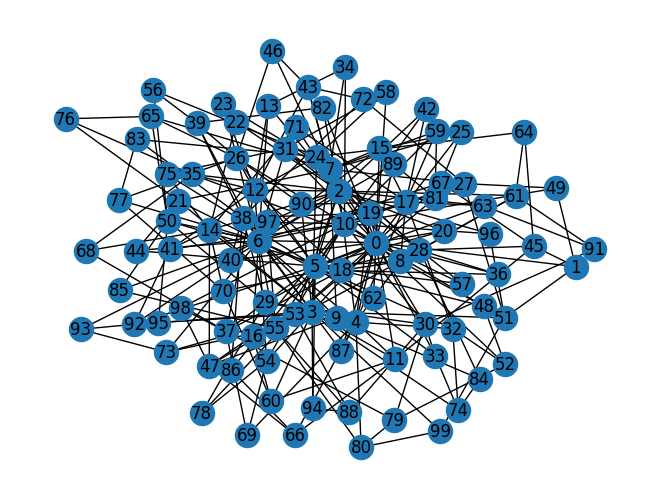

In [214]:
# Params:
# n - number of vertices
# m - number of edges in new nodes

n = 100
m = 3

g = nx.barabasi_albert_graph(n=n, m=m)
nx.draw(g, with_labels=True)

### 3.1 Fixed n=100

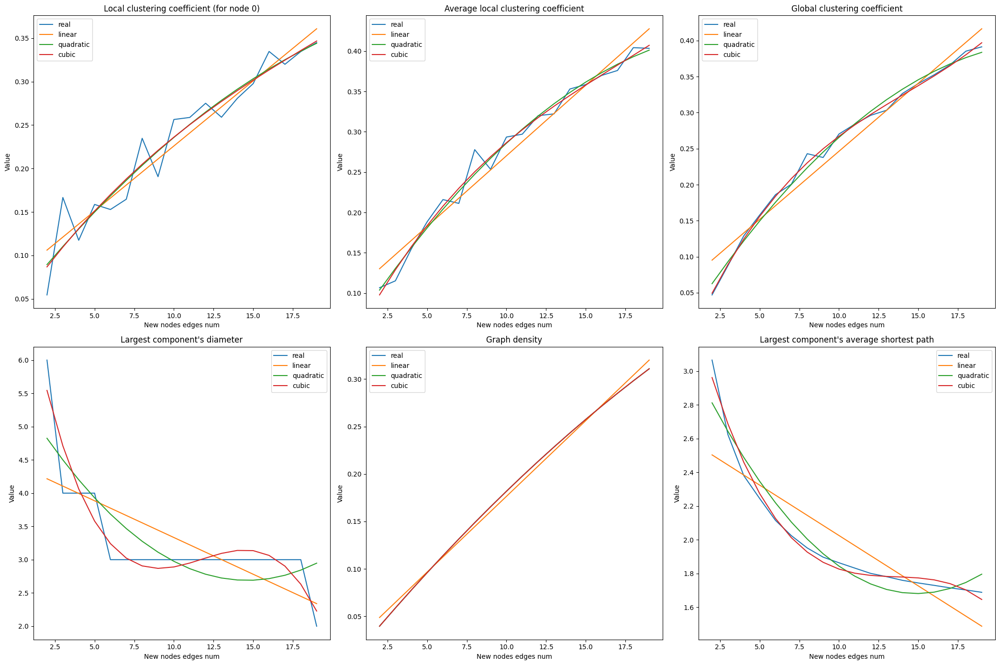

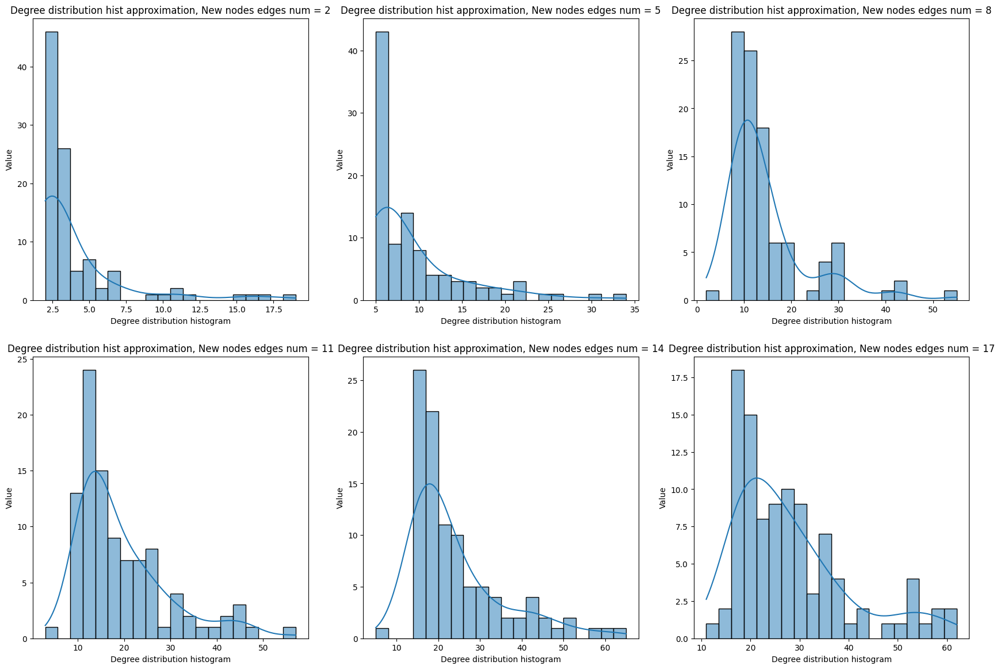

In [215]:
n = 100
m_s = np.arange(2, 20, 1)
param_name = "New nodes edges num"
graphs = [nx.barabasi_albert_graph(n=n, m=m) for m in m_s]

compute_plot_all_characteristics(m_s, graphs, param_name)
compute_plot_degree_dist(m_s, graphs, param_name)

### 3.2 Fixed m=3

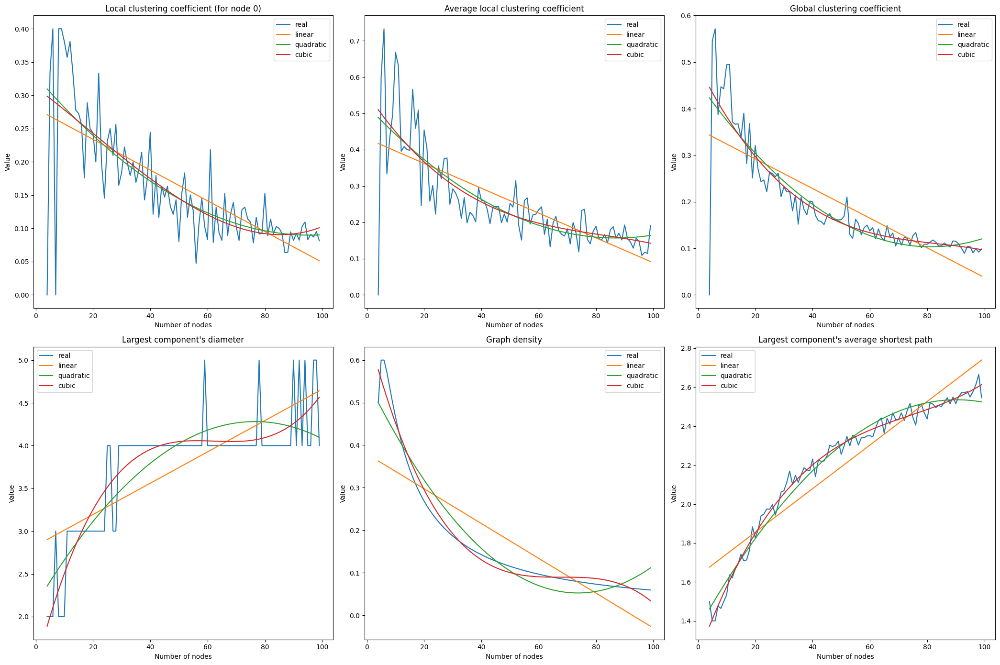

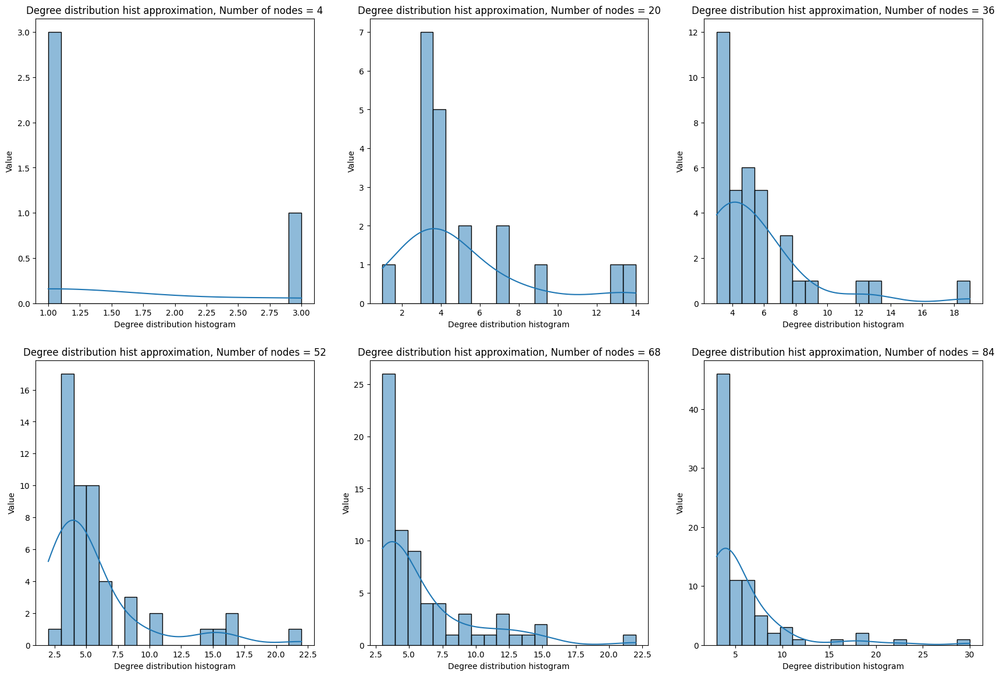

In [217]:
m = 3
n_s = np.arange(4, 100, 1)
param_name = "Number of nodes"
graphs = [nx.barabasi_albert_graph(n=n, m=m) for n in n_s]

compute_plot_all_characteristics(n_s, graphs, param_name)
compute_plot_degree_dist(n_s, graphs, param_name)

# Other

is_connected :  True
diameter :  3
density :  0.3333333333333333
average_local_clustering_cf :  0.3901429681429683
global_clustering_cf :  0.376425855513308
average_length :  1.71


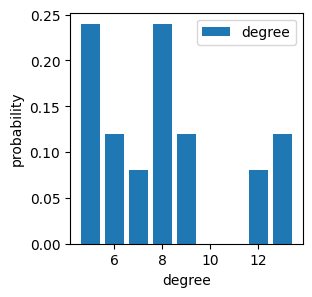

In [ ]:
is_connected, diameter, density, average_local_clustering_cf, global_clustering_cf, (degree_values, degree_hist), average_length = get_metrics(g)
%p is_connected
%p diameter
%p density
%p average_local_clustering_cf
%p global_clustering_cf
%p average_length

plt.figure(figsize=(3, 3))
plt.bar(degree_values, degree_hist)
plt.legend(['degree'])
plt.xlabel('degree')
plt.ylabel('probability')
plt.show()

In [ ]:
m_range = [1, 2, 3, 4, 5]
n_range = [x * x for x in range(4, 20, 2)]

n_metrics = defaultdict(list)
fixed_m = 3

m_metrics = defaultdict(list)
fixed_n = 256

# Метрики по n
for param in n_range:
    get_graph = lambda param: make_graph_connected(nx.barabasi_albert_graph(param, fixed_m, seed=228))
    calc_metrics(param, get_graph, n_metrics, avg_times=10)

# Метрики по m
for param in m_range:
    get_graph = lambda param: make_graph_connected(nx.barabasi_albert_graph(fixed_n, param, seed=228))
    calc_metrics(param, get_graph, m_metrics, avg_times=10)

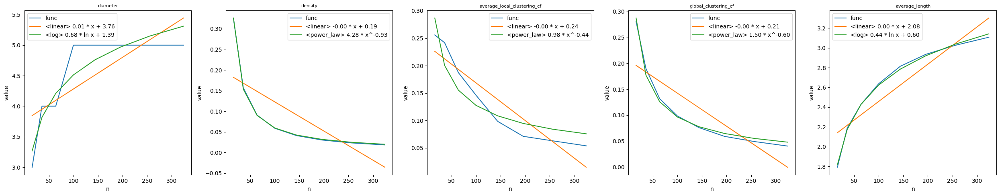

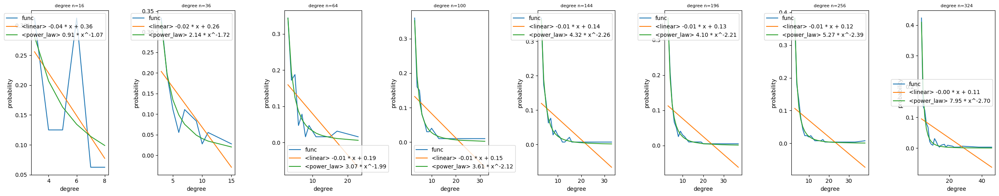

In [ ]:
approxim_by = {
    'diameter': [fit_linear, fit_log],
    'density': [fit_linear, fit_power_law],
    'average_local_clustering_cf': [fit_linear, fit_power_law],
    'global_clustering_cf': [fit_linear, fit_power_law],
    'average_length': [fit_linear, fit_log],
    'degree': [fit_linear, fit_power_law],
}

plot_metrics(n_range, n_metrics, 'n', approxim_by)

Анализ:

1. diameter и средняя пути растут логарифмически при росте n
2. density уменьшается по степенному закону при росте n
3. коэффициенты кластеризации уменьшаются по степенному закону при росте n

Нижние графики можно аппроксимировать степенным законом. Не зависит относительно n

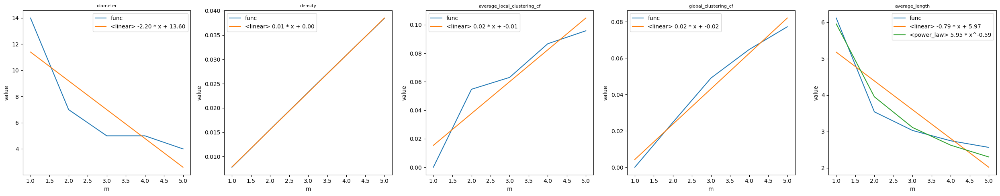

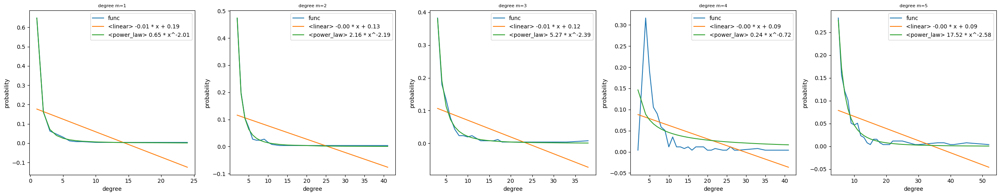

In [ ]:
approxim_by = {
    'diameter': [fit_linear],
    'density': [fit_linear],
    'average_local_clustering_cf': [fit_linear],
    'global_clustering_cf': [fit_linear],
    'average_length': [fit_linear, fit_power_law],
    'degree': [fit_linear, fit_power_law],
}

plot_metrics(m_range, m_metrics, 'm', approxim_by)

Анализ:

1. diameter и средняя пути окололинейно уменьшаются при увеличении m
2. density линейно увеличивается росте m
3. коэффициенты кластеризации увеличиваются при росте m

Нижние графики можно аппроксимировать степенным законом. При увеличении m график смещается вправо что очевидно т.к увеличивается m.

Выводы: Степени вершин распределены по степенному закону. Диаметр графа и средняя длина между двумя вершинами растут логарифмически. Однако коэфициент кластеризации достаточно низкий.

# 4. Kleinberg model

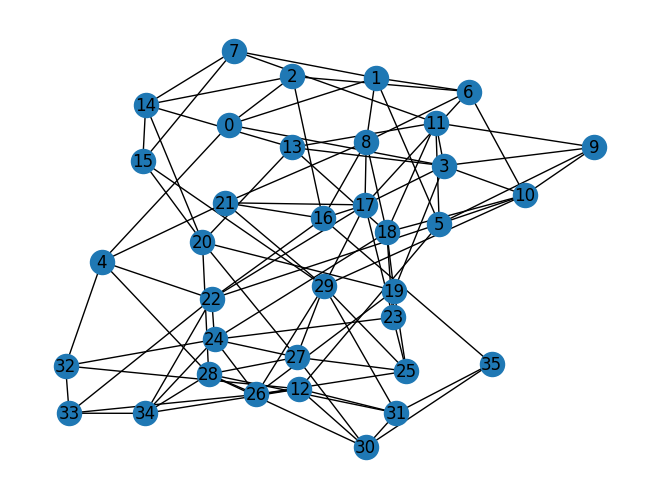

In [234]:
# Params:
# n - square root of number of vertices
# q - number of long-range connections

n = 6
q = 2

g = nx.navigable_small_world_graph(n=n, q=q).to_undirected()
g.remove_edges_from(nx.selfloop_edges(g))
g = nx.convert_node_labels_to_integers(g)

nx.draw(g, with_labels = True)

### 4.1 Fixed n=10

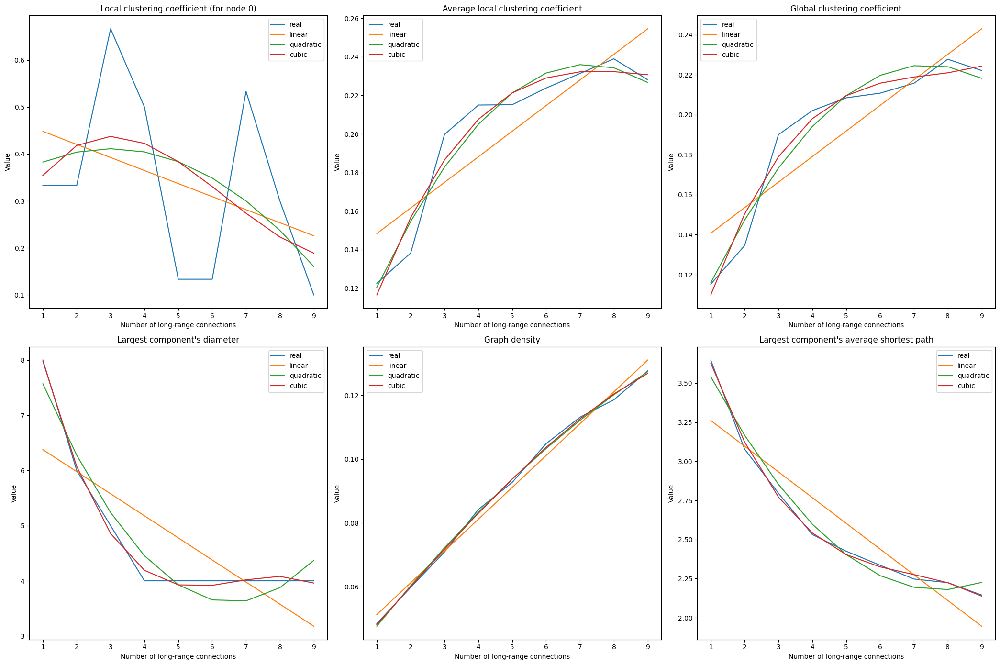

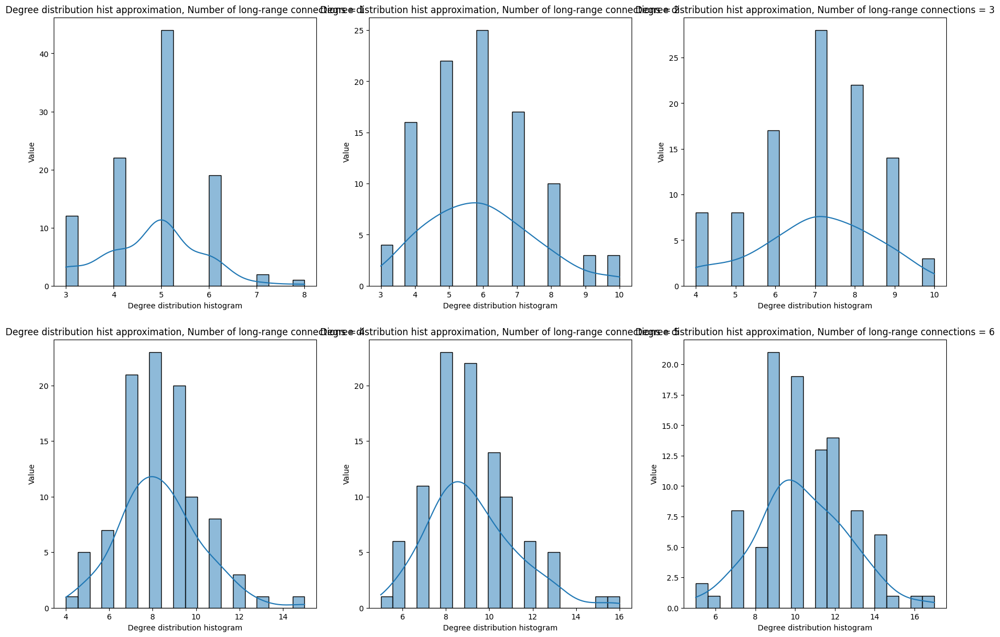

In [235]:
n = 10
q_s = np.arange(1, 10, 1)
param_name = "Number of long-range connections"
graphs = []
for q in q_s:
    g = nx.navigable_small_world_graph(n=n, q=q).to_undirected()
    g.remove_edges_from(nx.selfloop_edges(g))
    g = nx.convert_node_labels_to_integers(g)
    graphs.append(g)

compute_plot_all_characteristics(q_s, graphs, param_name)
compute_plot_degree_dist(q_s, graphs, param_name)

### 4.2 Fixed q=2

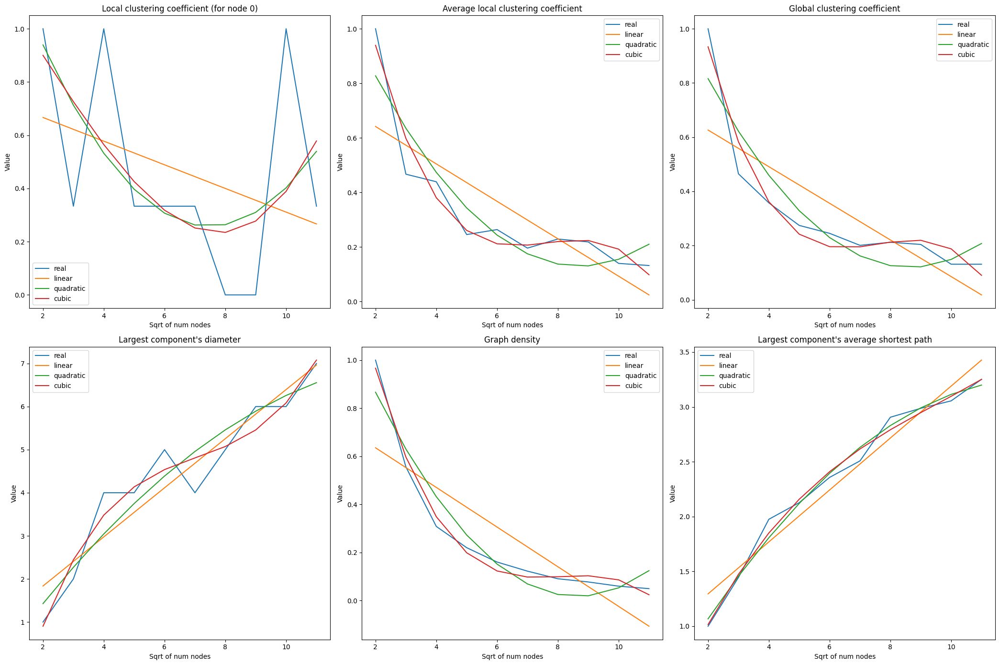

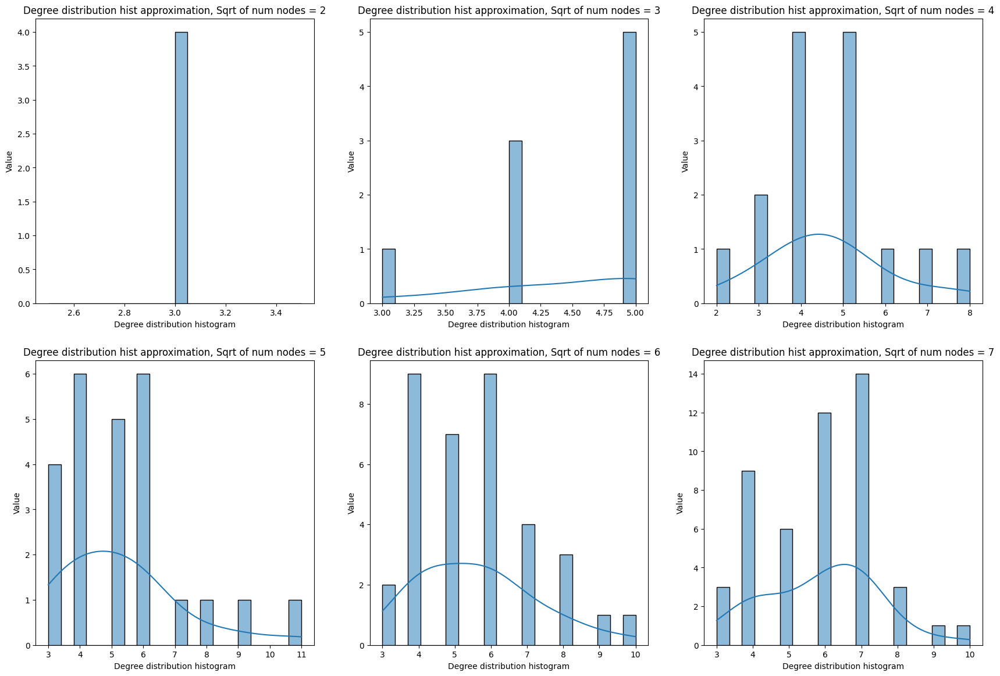

In [236]:
q = 2
n_s = np.arange(2, 12, 1)
param_name = "Sqrt of num nodes"
graphs = []
for n in n_s:
    g = nx.navigable_small_world_graph(n=n, q=q).to_undirected()
    g.remove_edges_from(nx.selfloop_edges(g))
    g = nx.convert_node_labels_to_integers(g)
    graphs.append(g)

compute_plot_all_characteristics(n_s, graphs, param_name)
compute_plot_degree_dist(n_s, graphs, param_name)

# Other

is_connected :  True
diameter :  5
density :  0.18666666666666668
average_local_clustering_cf :  0.2518095238095238
global_clustering_cf :  0.2523364485981308
average_length :  2.3366666666666664


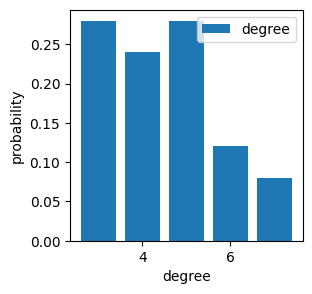

In [ ]:
is_connected, diameter, density, average_local_clustering_cf, global_clustering_cf, (degree_values, degree_hist), average_length = get_metrics(g)
%p is_connected
%p diameter
%p density
%p average_local_clustering_cf
%p global_clustering_cf
%p average_length

plt.figure(figsize=(3, 3))
plt.bar(degree_values, degree_hist)
plt.legend(['degree'])
plt.xlabel('degree')
plt.ylabel('probability')
plt.show()

In [ ]:
def handle_kleinberg_graph(g):
  g.remove_edges_from(nx.selfloop_edges(g))
  g = nx.convert_node_labels_to_integers(g)
  g = make_graph_connected(g)
  return g


q_range = [1, 2, 3, 4, 5, 6]
n_range = [x * x for x in range(4, 20, 2)]

n_metrics = defaultdict(list)
fixed_q = 1

q_metrics = defaultdict(list)
fixed_n = 3

# Метрики по n
for param in n_range:
    get_graph = lambda param: make_graph_connected(handle_kleinberg_graph(nx.navigable_small_world_graph(int(pow(param, 0.5)), q=fixed_q, seed=228).to_undirected()))
    calc_metrics(param, get_graph, n_metrics, avg_times=10)

# Метрики по q
for param in q_range:
    get_graph = lambda param: make_graph_connected(handle_kleinberg_graph(nx.navigable_small_world_graph(fixed_n, q=param, seed=228).to_undirected()))
    calc_metrics(param, get_graph, q_metrics, avg_times=10)

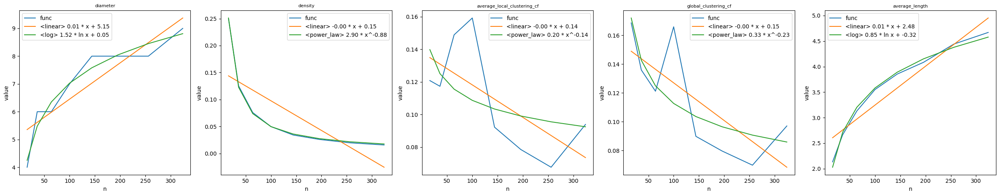

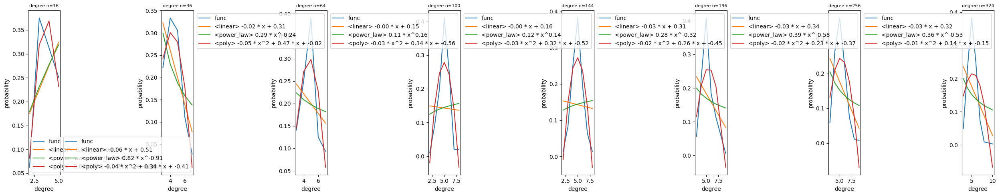

In [ ]:
approxim_by = {
    'diameter': [fit_linear, fit_log],
    'density': [fit_linear, fit_power_law],
    'average_local_clustering_cf': [fit_linear, fit_power_law],
    'global_clustering_cf': [fit_linear, fit_power_law],
    'average_length': [fit_linear, fit_log],
    'degree': [fit_linear, fit_power_law, fit_poly2d],
}

plot_metrics(n_range, n_metrics, 'n', approxim_by)

Анализ:

1. diameter и средняя пути логарифмически растут при увеличении n
2. density уменьшается по степенному закону при увеличении n
3. коэффициенты кластеризации имеют сложную структуру, лучше всего аппроксимируются по степенному закону

Нижние графики можно аппроксимировать полиномом второй степени.

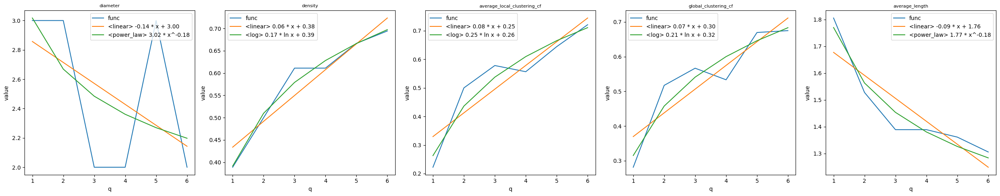

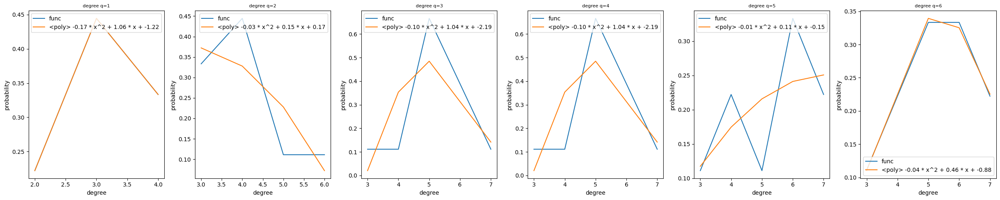

In [ ]:
approxim_by = {
    'diameter': [fit_linear, fit_power_law],
    'density': [fit_linear, fit_log],
    'average_local_clustering_cf': [fit_linear, fit_log],
    'global_clustering_cf': [fit_linear, fit_log],
    'average_length': [fit_linear, fit_power_law],
    'degree': [fit_poly2d],
}

plot_metrics(q_range, q_metrics, 'q', approxim_by)

Анализ:

Можно отметить явную прямопропорциональную зависимость между числом дальних связей, кф кластеризации и плотностью. Также видно что диаметр и среднее расстояние уменьшаются с ростом q. Однако сложно определить тип аппроксимирующей функции - она либо линейная, либо логарифмическая / степенная

Выводы: Видно, что графы обладают сравнительно небольшим диаметром, возможно диаметр растет логарифмически с увеличением n. Однако степени вершин явно распределены не по степенному закону.

# Navigable Small World

In [238]:
# Taken from http://ethen8181.github.io/machine-learning/deep_learning/multi_label/nsw.html#Navigable-Small-World

import heapq
import random
from scipy.spatial import distance
from typing import List, Tuple

class Node:
    """
    Node for a navigable small world graph.

    Parameters
    ----------
    idx : int
        For uniquely identifying a node.

    value : 1d np.ndarray
        To access the embedding associated with this node.

    neighborhood : set
        For storing adjacent nodes.

    References
    ----------
    https://book.pythontips.com/en/latest/__slots__magic.html
    https://hynek.me/articles/hashes-and-equality/
    """
    __slots__ = ['idx', 'value', 'neighborhood']

    def __init__(self, idx, value):
        self.idx = idx
        self.value = value
        self.neighborhood = set()

    def __hash__(self):
        return hash(self.idx)

    def __eq__(self, other):
        return (
            self.__class__ == other.__class__ and
            self.idx == other.idx
        )

def nsw_knn_search(
    graph: List[Node],
    query: np.ndarray,
    k: int=5,
    m: int=50) -> Tuple[List[Tuple[float, int]], float]:
    """
    Performs knn search using the navigable small world graph.

    Parameters
    ----------
    graph :
        Navigable small world graph from build_nsw_graph.

    query : 1d np.ndarray
        Query embedding that we wish to find the nearest neighbors.

    k : int
        Number of nearest neighbors returned.

    m : int
        The recall set will be chosen from m different entry points.

    Returns
    -------
    The list of nearest neighbors (distance, index) tuple.
    and the average number of hops that was made during the search.
    """
    result_queue = []
    visited_set = set()

    hops = 0
    for _ in range(m):
        # random entry point from all possible candidates
        entry_node = random.randint(0, len(graph) - 1)
        entry_dist = distance.cosine(query, graph[entry_node].value)
        candidate_queue = []
        heapq.heappush(candidate_queue, (entry_dist, entry_node))

        temp_result_queue = []
        while candidate_queue:
            candidate_dist, candidate_idx = heapq.heappop(candidate_queue)

            if len(result_queue) >= k:
                # if candidate is further than the k-th element from the result,
                # then we would break the repeat loop
                current_k_dist, current_k_idx = heapq.nsmallest(k, result_queue)[-1]
                if candidate_dist > current_k_dist:
                    break

            for friend_node in graph[candidate_idx].neighborhood:
                if friend_node not in visited_set:
                    visited_set.add(friend_node)

                    friend_dist = distance.euclidean(query, graph[friend_node].value)
                    heapq.heappush(candidate_queue, (friend_dist, friend_node))
                    heapq.heappush(temp_result_queue, (friend_dist, friend_node))
                    hops += 1

        result_queue = list(heapq.merge(result_queue, temp_result_queue))

    return heapq.nsmallest(k, result_queue), hops / m

def build_nsw_graph(index_factors: np.ndarray, k: int) -> List[Node]:
    n_nodes = index_factors.shape[0]

    graph = []
    for i, value in enumerate(index_factors):
        node = Node(i, value)
        if i > k:
            neighbors, hops = nsw_knn_search(graph, node.value, k)
            neighbors_indices = [node_idx for _, node_idx in neighbors]
        else:
            neighbors_indices = list(range(i))

        # insert bi-directional connection
        node.neighborhood.update(neighbors_indices)
        for i in neighbors_indices:
            graph[i].neighborhood.add(node.idx)

        graph.append(node)

    return graph


def to_networkx(nodes):
  graph = nx.Graph()
  for node in nodes:
    graph.add_node(node.idx)

  for node in nodes:
    for friend in node.neighborhood:
      graph.add_edge(node.idx, friend)

  return graph

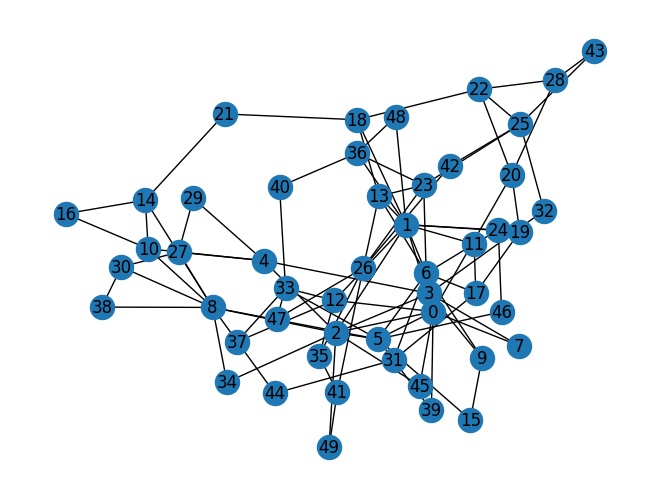

In [241]:
# Params:
# n - number of vertices
# k - number of neighbors for new vertice

n = 50
k = 2

g = to_networkx(build_nsw_graph(np.random.rand(n, 10), k=k))
nx.draw(g, with_labels = True)

### 5.1 Fixed n=100

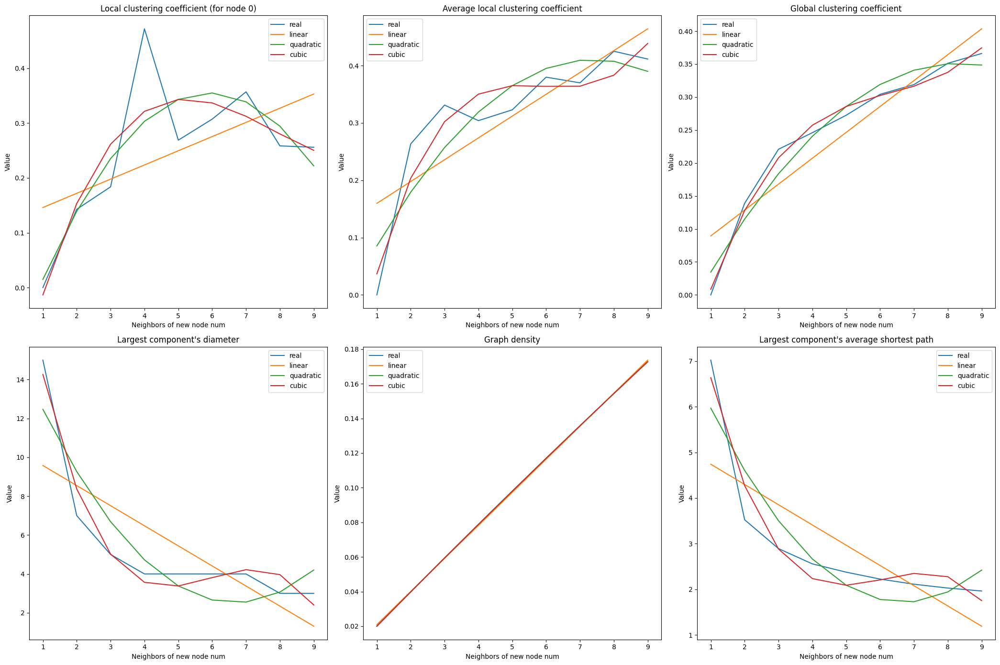

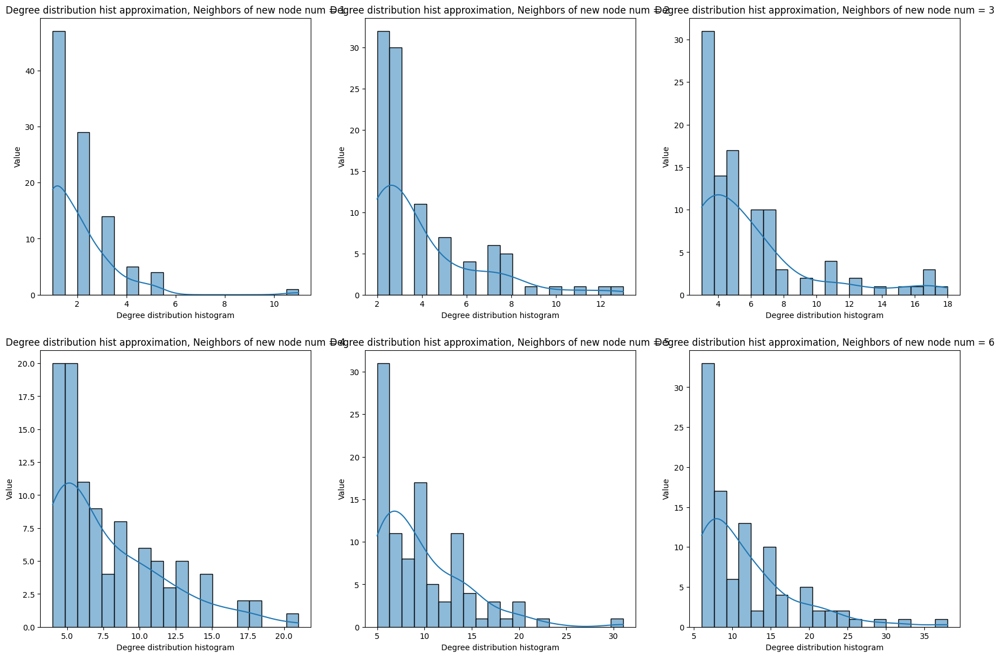

In [242]:
n = 100
k_s = np.arange(1, 10, 1)
param_name = "Neighbors of new node num"
graphs = [to_networkx(build_nsw_graph(np.random.rand(n, 10), k=k)) for k in k_s]

compute_plot_all_characteristics(k_s, graphs, param_name)
compute_plot_degree_dist(k_s, graphs, param_name)

### 5.2 Fixed k=2

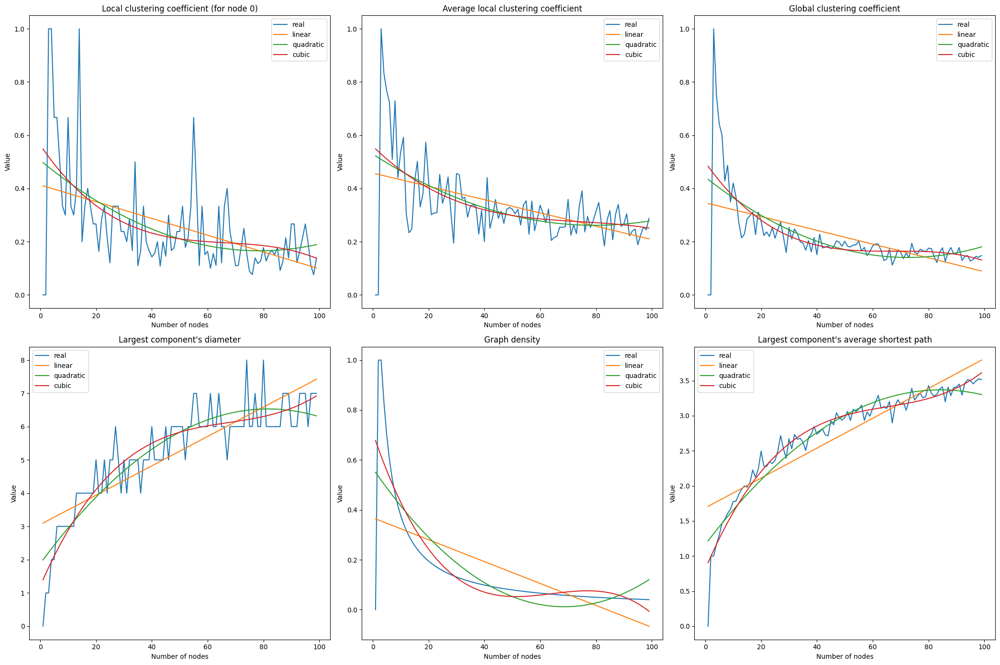

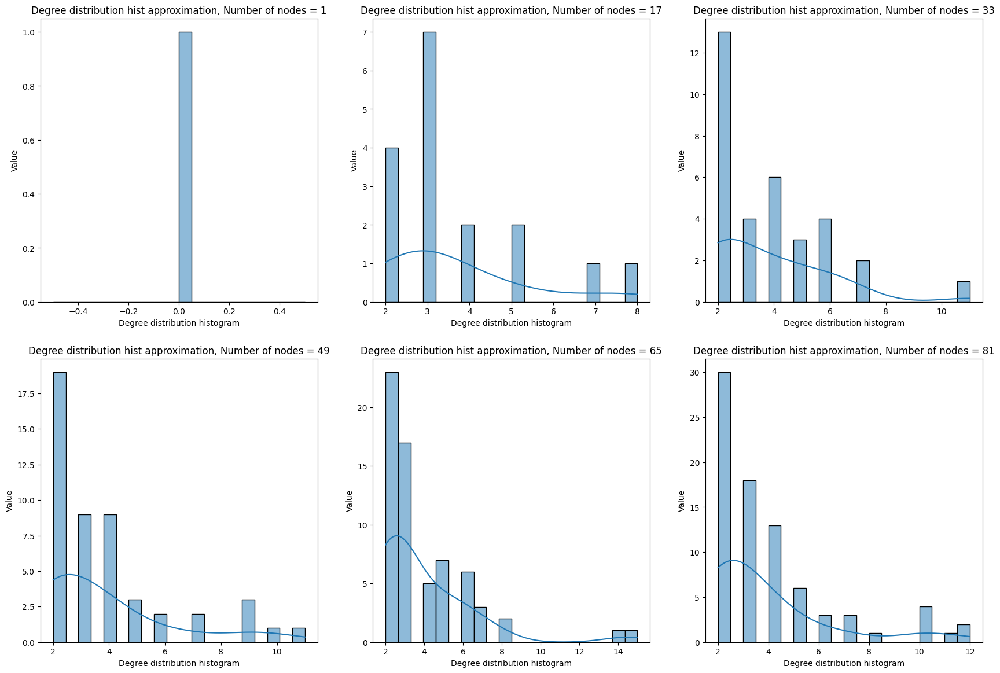

In [243]:
k = 2
n_s = np.arange(1, 100, 1)
param_name = "Number of nodes"
graphs = [to_networkx(build_nsw_graph(np.random.rand(n, 10), k=k)) for n in n_s]

compute_plot_all_characteristics(n_s, graphs, param_name)
compute_plot_degree_dist(n_s, graphs, param_name)

# Other

is_connected :  True
diameter :  4
density :  0.23
average_local_clustering_cf :  0.5686984126984127
global_clustering_cf :  0.4342105263157895
average_length :  2.1433333333333335


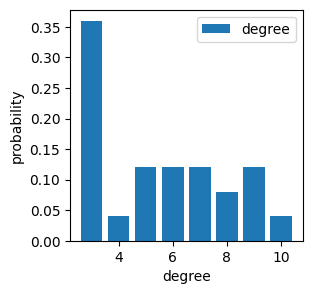

In [ ]:
is_connected, diameter, density, average_local_clustering_cf, global_clustering_cf, (degree_values, degree_hist), average_length = get_metrics(g)
%p is_connected
%p diameter
%p density
%p average_local_clustering_cf
%p global_clustering_cf
%p average_length

plt.figure(figsize=(3, 3))
plt.bar(degree_values, degree_hist)
plt.legend(['degree'])
plt.xlabel('degree')
plt.ylabel('probability')
plt.show()

In [ ]:
k_range = [1, 2, 3, 4, 5]
n_range = [x * x for x in range(4, 20, 2)]

n_metrics = defaultdict(list)
fixed_k = 3

k_metrics = defaultdict(list)
fixed_n = 100

# Метрики по n
for param in n_range:
    get_graph = lambda param: to_networkx(build_nsw_graph(np.random.rand(param, 2), fixed_k))
    calc_metrics(param, get_graph, n_metrics, avg_times=10)

# Метрики по k
for param in k_range:
    get_graph = lambda param: to_networkx(build_nsw_graph(np.random.rand(fixed_n, 2), param))
    calc_metrics(param, get_graph, k_metrics, avg_times=10)

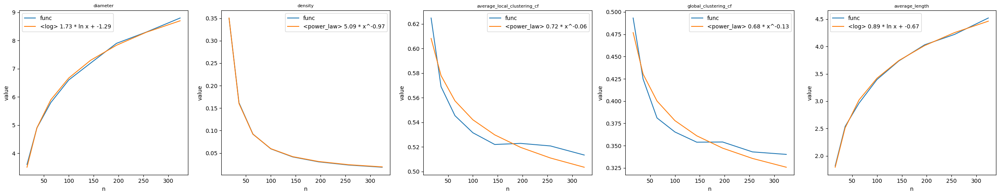

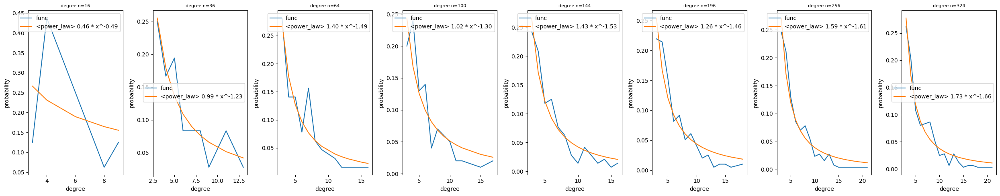

In [ ]:
approxim_by = {
    'diameter': [fit_log],
    'density': [fit_power_law],
    'average_local_clustering_cf': [fit_power_law],
    'global_clustering_cf': [fit_power_law],
    'average_length': [fit_log],
    'degree': [fit_power_law],
}

plot_metrics(n_range, n_metrics, 'n', approxim_by)

Анализ:

Видно, что диаметр растет логарифмически с увеличением n.

В то же время плотность и кф кластеризации также уменьшаются по степенному закону (возможно логарифмически)

Степени распределены по степенному закону - и это становится все более явно при увеличении n

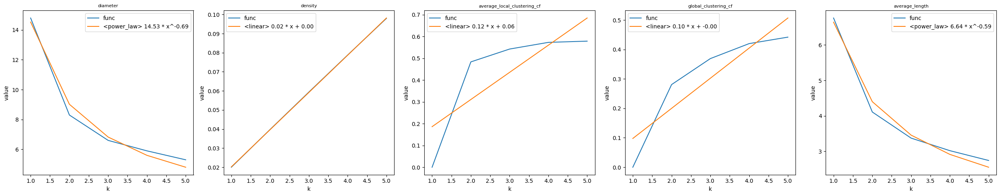

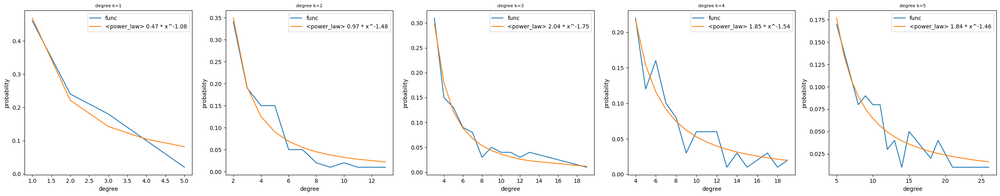

In [ ]:
approxim_by = {
    'diameter': [fit_power_law],
    'density': [fit_linear],
    'average_local_clustering_cf': [fit_linear],
    'global_clustering_cf': [fit_linear],
    'average_length': [fit_power_law],
    'degree': [fit_power_law],
}

plot_metrics(k_range, k_metrics, 'k', approxim_by)

Анализ:

Очевидно, что при увеличении k ближайших соседей уменьшается диаметр и среднее расстояние между вершинами и увеличиваются кф кластеризации с плотностью.

При увеличении k видно что степени вершин смещаются вправо, что тоже очевидно т.к увеличивается минимальная степень вершин.

Выводы: Модель наилучшим образом реализует модель тесного мира, т.к степени вершин распределены по степенному закону, диаметр относительно небольшой и растет логарифмически, а также кф кластеризации достаточно большие по сравнению с остальными графиками + можно его регулировать через k